In [2]:
%matplotlib inline
import numpy as np
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import cv2
import os

In [6]:
# DEFINE DISCRIMINATOR

# The discriminator model takes a sample image (from our dataset) as input and outputs a binary classification prediction.
# Input: 32 x 32 pixels 3 color channel (rgb) image [32,32,3]
# Output: Binary classification (0.0 to 1.0 - is it real or fake).

def define_discriminator(input_shape=(32,32,3)):
    model = keras.models.Sequential()
    # The discriminator is composed of a set convolutional layers, 
    # 1 normal convolutional layer followed by a set of 
    # 3 convolutional layers with a 2 x 2 stride. Together this layers 
    # Downsample the image from 32 x 32 x 3 all the way to 4 x 4 x 3.
    # Input is a 32*32*3 image
    model.add(keras.layers.Conv2D(filters=64,kernel_size= (3,3),padding = 'same',input_shape = input_shape))
    
    # The use of LeakyReLU, dropout and Adam as well as their 
    # parameters are derived from the documentation and good practices suggestions. 

    model.add(keras.layers.LeakyReLU(0.2))
    #model.add(keras.layers.Dropout(0.4))

    # Downsample 16*16*3 image
    model.add(keras.layers.Conv2D(filters= 128,kernel_size= (3,3),strides = (2,2),padding = 'same'))
    model.add(keras.layers.LeakyReLU(0.2))
    #model.add(keras.layers.Dropout(0.4))
    
    # Downsample 8*8*3 image
    model.add(keras.layers.Conv2D(filters= 128,kernel_size= (4,4),strides = (2,2),padding = 'same'))
    model.add(keras.layers.LeakyReLU(0.2))
    #model.add(keras.layers.Dropout(0.4))
    
    # Downsample 4*4*3
    model.add(keras.layers.Conv2D(filters= 256, kernel_size= (4,4), strides = (2,2), padding = 'same'))
    model.add(keras.layers.LeakyReLU(0.2))
    #model.add(keras.layers.Dropout(0.4))
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dropout(0.4))

    # We have a single node in the output layer with 
    # sigmoid activation function for the prediction (real or fake)

    model.add(keras.layers.Dense(units= 1,activation = 'sigmoid'))
    opt = keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)
    model.compile(loss= 'binary_crossentropy', optimizer= opt, metrics = ['accuracy'])
    
    return model

In [7]:
# DEFINE GENERATOR

# The generator should output new fake images.
# It takes a point in the latent space as input and outputs a 32 x 32 rgb image.
# By assigning meaning to this latent points during the training process the latent space turns into a compressed repressentation of the dataset, generating "real" images.

# Input: Point in latent space
# Output: Rgb Image of 32 × 32 pixels (pixel values between -1 - 1)

def define_generator(latent_dim):
  # use a hidden dense layer to represent a low resolution version of the output (4 x 4 x 3).
  # Give enough nodes (256 - Arbitrary - can be changed) for multiple versions 
  # of the output image (more feature maps).
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units= 256 * 4 * 4, input_dim = latent_dim)) #4 * 4 Arbitrary - Can be changed to test different results
    model.add(keras.layers.LeakyReLU(0.2)) # LeakyReLU with a default slope of 0.2, reported as a good practice. 
    model.add(keras.layers.Reshape((4, 4, 256)))
    # Pass the resulting feature maps into convolutional layer. 
    # Upsample the image to higher resolution.
    # Use Conv2DTranspose for upsampling with a stride of 2x2 
    # Repeat upsampling until achieving our 32 x 32 size goal.

    # Upsample 8 * 8 
    model.add(keras.layers.Conv2DTranspose(filters= 128, kernel_size = (4,4),padding='same', strides= (2,2)))
    model.add(keras.layers.LeakyReLU(0.2))
    # Upsample 16 * 16 
    model.add(keras.layers.Conv2DTranspose(filters= 128, kernel_size = (4,4),padding='same', strides= (2,2)))
    model.add(keras.layers.LeakyReLU(0.2))
    # Upsample  32 * 32 now
    model.add(keras.layers.Conv2DTranspose(filters= 128, kernel_size = (4,4),padding='same', strides= (2,2)))
    model.add(keras.layers.LeakyReLU(0.2))

    # Conv2D output layer with 3 filters (3 channels) with a kernel size of 3 
    # for generation of single feature map with preserved dimensions (32 x 32 x 3)
    # Use Than activation (good practice) to ensure the values are in range (from -1 to 1).
    model.add(keras.layers.Conv2D(filters= 3, kernel_size= (3,3),padding = 'same', activation= 'tanh')) 

    # the generated images are completely random pixel values in [-1, 1], rescaled to [0, 1].
    
    return model

In [8]:
# DEFINE GAN

# Generator weights are updated based in the discriminator performance. 
# The Gan function is defined to send the output from the generator to the discriminator, classified it, and then update generators weight. 
# Mark generator samples as real samples (trick discriminator)
# Discriminator is marked as not trainable (to avoid over trainning with fake samples).
def define_GAN(g_model, d_model):
    d_model.trainable = False
    model = keras.models.Sequential()
    model.add(g_model)
    model.add(d_model)
    opt = keras.optimizers.Adam(learning_rate= 0.0002,beta_1= 0.5)
    model.compile(loss= 'binary_crossentropy', optimizer= opt)
    return model

In [11]:
# GENERATE SAMPLE

# Canadian Institute For Advanced Research dataset of 60,000 32 × 32 pixel color photographs of objects from 10 classes.
# https://www.cs.toronto.edu/~kriz/cifar.html
def load_data():
    (X_train, _), (_, _) = keras.datasets.cifar10.load_data()
    return X_train

In [10]:
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    X = np.random.randn(latent_dim * n_samples) # generate points in the latent space
    X = X.reshape((n_samples, latent_dim)) # reshape into a batch of inputs for the network
    return X

In [12]:
# select real samples
def generate_real_sample(n_samples):
    data = load_data() #we are loading the data withouth labels
    ix = np.random.randint(0,data.shape[0], n_samples)
    X = data[ix] # retrieve selected random images
    X = X.reshape((n_samples, 32, 32, 3)).astype('float32')
    X = (X - 127.5) / 127.5 # scale from [0,255] to [-1,1]
    y = np.ones((n_samples, 1)) # create real class labels
    return X, y

In [13]:
# use the generator to generate n fake examples, with class labels
def generate_fake_sample(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim= latent_dim,n_samples= n_samples)  # generate points in latent space
    X = g_model.predict(x_input) # predict outputs
    y = np.zeros((n_samples, 1)) # create class labels 
    return X, y

In [14]:
# SUMMARIZE AND PLOT 

# create and save a plot of generated images
def save_plot(x_input, epoch, n=7):
    x_input = (x_input + 1.0) / 2.0
    filename = f'generated_{epoch + 1}.png'
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        plt.imshow(x_input[i,:,:,:])
        plt.axis('off')
    plt.savefig(filename)
    plt.show()
    plt.close()

In [15]:
# Evaluate discriminator, plot generated images, save generator model
def summarize_the_model(g_model, d_model, epoch, latent_dim, n_samples):
    X_real, y_real = generate_real_sample(n_samples= n_samples)
    X_fake, y_fake = generate_fake_sample(g_model= g_model,
                                          latent_dim= latent_dim,
                                          n_samples= n_samples)
    print(f'Accuracy on real data: {d_model.evaluate(X_real, y_real, verbose= 0)}')
    print(f'Accuracy on fake data: {d_model.evaluate(X_fake, y_fake, verbose= 0)}')
    filename = f'model_e_{epoch + 1}.h5'
    save_plot(x_input= X_fake,
              epoch= epoch)
    
    g_model.save(filename)

In [16]:
# MODEL TRAINING

# train the generator and discriminator
def train_GAN(gan_model, g_model, d_model, dataset_len, latent_dim, iters= 200, batch_size= 256):
    half_batch = int(batch_size / 2)
    batch_per_epoch = int(dataset_len / batch_size)
    for i in range(iters):
        for j in range(batch_per_epoch):
            X_real, y_real = generate_real_sample(n_samples= half_batch)
            X_fake, y_fake = generate_fake_sample(g_model= g_model,
                                                  latent_dim= latent_dim,
                                                  n_samples= half_batch)
            X, y = np.vstack((X_real, X_fake)), np.vstack((y_real, y_fake))
            d_model.train_on_batch(X, y)
            
            x_gan = generate_latent_points(latent_dim= latent_dim,
                                             n_samples= batch_size)
            y_gan = np.ones((batch_size, 1))
            gan_model.train_on_batch(x_gan, y_gan)
            if not j%100: 
                print(f'Epoch: {i+1}, Batches/Epoch: {j+1}/{batch_per_epoch}')
                summarize_the_model(g_model= g_model,
                                    d_model= d_model,
                                    epoch= i,
                                    latent_dim= latent_dim,
                                    n_samples= batch_size)

170500096/170498071 [==============================] - 90s 1us/step
Epoch: 1, Batches/Epoch: 1/195
Accuracy on real data: [0.6403061151504517, 1.0]
Accuracy on fake data: [0.6956417560577393, 0.0]


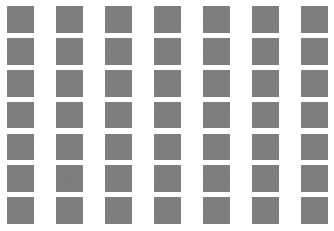

Epoch: 1, Batches/Epoch: 101/195
Accuracy on real data: [0.539707601070404, 0.74609375]
Accuracy on fake data: [0.0182306207716465, 1.0]


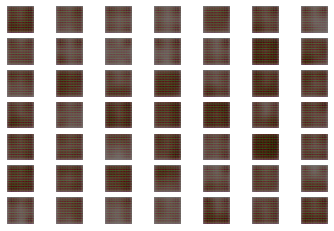

Epoch: 2, Batches/Epoch: 1/195
Accuracy on real data: [0.7204697728157043, 0.58203125]
Accuracy on fake data: [0.5890121459960938, 0.7109375]


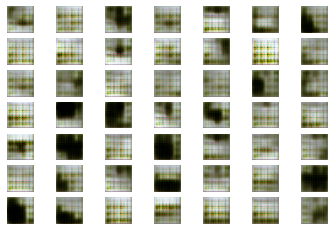

Epoch: 2, Batches/Epoch: 101/195
Accuracy on real data: [0.5824066996574402, 0.7265625]
Accuracy on fake data: [0.34056445956230164, 0.8359375]


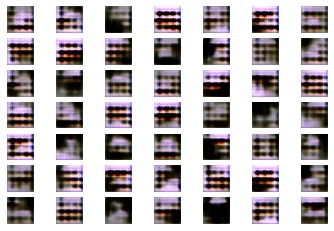

Epoch: 3, Batches/Epoch: 1/195
Accuracy on real data: [0.39690473675727844, 0.8203125]
Accuracy on fake data: [0.45611050724983215, 0.80078125]


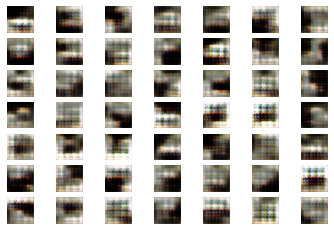

Epoch: 3, Batches/Epoch: 101/195
Accuracy on real data: [0.32287800312042236, 0.87109375]
Accuracy on fake data: [0.2845248281955719, 1.0]


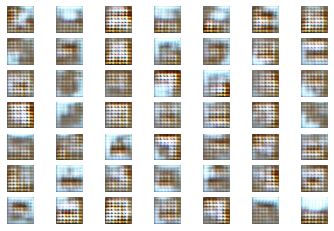

Epoch: 4, Batches/Epoch: 1/195
Accuracy on real data: [0.35985633730888367, 0.84375]
Accuracy on fake data: [0.7053622007369995, 0.62890625]


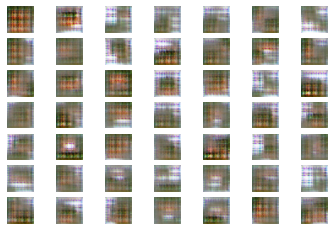

Epoch: 4, Batches/Epoch: 101/195
Accuracy on real data: [0.40905430912971497, 0.85546875]
Accuracy on fake data: [0.44525575637817383, 0.87890625]


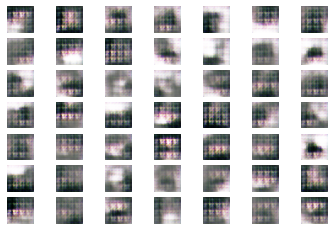

Epoch: 5, Batches/Epoch: 1/195
Accuracy on real data: [0.6447716355323792, 0.69140625]
Accuracy on fake data: [1.0690720081329346, 0.53125]


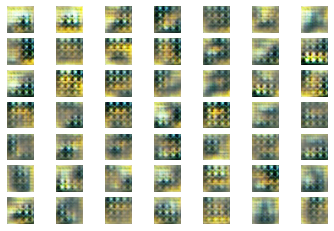

Epoch: 5, Batches/Epoch: 101/195
Accuracy on real data: [0.5296300649642944, 0.69921875]
Accuracy on fake data: [0.4247506260871887, 0.91796875]


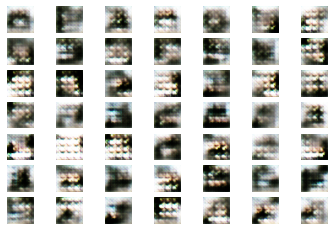

Epoch: 6, Batches/Epoch: 1/195
Accuracy on real data: [0.5738143920898438, 0.67578125]
Accuracy on fake data: [0.48890745639801025, 0.9140625]


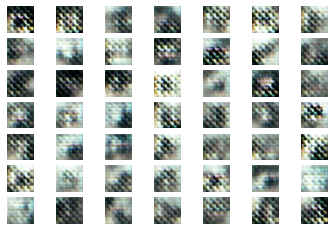

Epoch: 6, Batches/Epoch: 101/195
Accuracy on real data: [0.6339049935340881, 0.6015625]
Accuracy on fake data: [0.5462429523468018, 0.8046875]


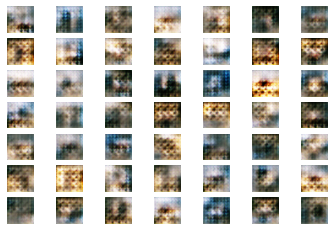

Epoch: 7, Batches/Epoch: 1/195
Accuracy on real data: [0.5291318893432617, 0.70703125]
Accuracy on fake data: [0.5564661622047424, 0.77734375]


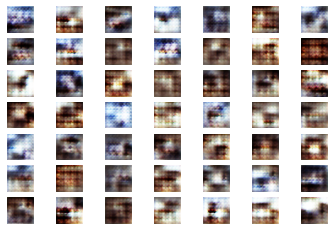

Epoch: 7, Batches/Epoch: 101/195
Accuracy on real data: [0.6039864420890808, 0.6640625]
Accuracy on fake data: [0.48655667901039124, 0.82421875]


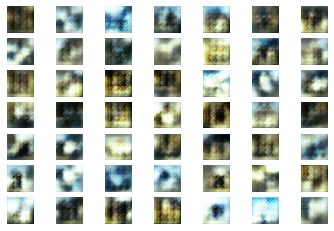

Epoch: 8, Batches/Epoch: 1/195
Accuracy on real data: [0.5137940049171448, 0.7265625]
Accuracy on fake data: [0.5529661178588867, 0.76953125]


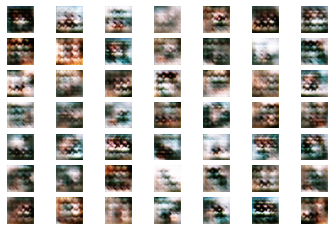

Epoch: 8, Batches/Epoch: 101/195
Accuracy on real data: [0.5935758352279663, 0.64453125]
Accuracy on fake data: [0.47384271025657654, 0.875]


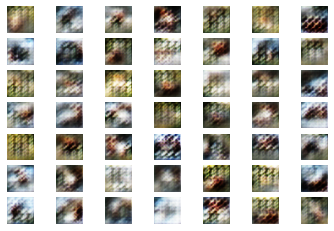

Epoch: 9, Batches/Epoch: 1/195
Accuracy on real data: [0.6546030044555664, 0.52734375]
Accuracy on fake data: [0.4442068934440613, 0.87890625]


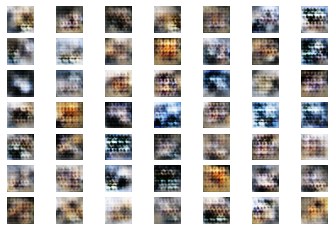

Epoch: 9, Batches/Epoch: 101/195
Accuracy on real data: [0.5983476042747498, 0.65625]
Accuracy on fake data: [0.5519262552261353, 0.73828125]


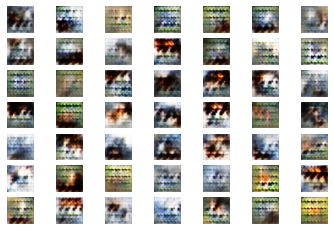

Epoch: 10, Batches/Epoch: 1/195
Accuracy on real data: [0.8515421152114868, 0.48828125]
Accuracy on fake data: [0.5030180215835571, 0.8359375]


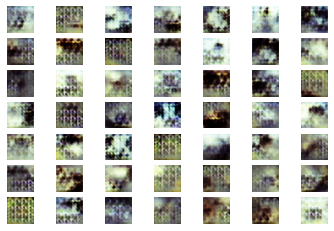

Epoch: 10, Batches/Epoch: 101/195
Accuracy on real data: [0.4914628565311432, 0.6953125]
Accuracy on fake data: [0.35438188910484314, 0.94921875]


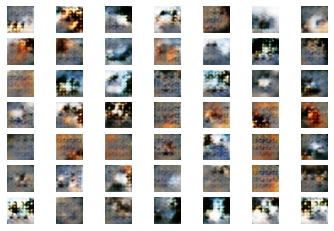

Epoch: 11, Batches/Epoch: 1/195
Accuracy on real data: [0.32391998171806335, 0.83203125]
Accuracy on fake data: [0.345355749130249, 0.9296875]


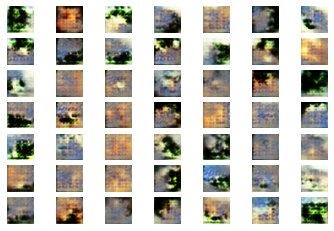

Epoch: 11, Batches/Epoch: 101/195
Accuracy on real data: [0.24311217665672302, 0.91015625]
Accuracy on fake data: [0.4851400852203369, 0.7890625]


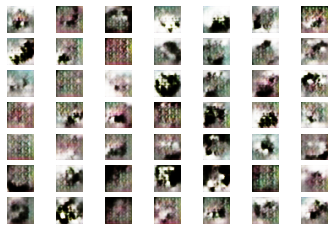

Epoch: 12, Batches/Epoch: 1/195
Accuracy on real data: [0.18318362534046173, 0.94140625]
Accuracy on fake data: [1.1228852272033691, 0.40625]


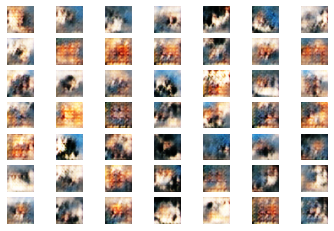

Epoch: 12, Batches/Epoch: 101/195
Accuracy on real data: [0.5419009923934937, 0.69140625]
Accuracy on fake data: [0.27975794672966003, 0.984375]


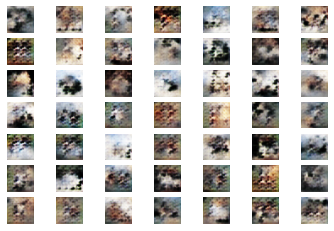

Epoch: 13, Batches/Epoch: 1/195
Accuracy on real data: [0.5991449952125549, 0.64453125]
Accuracy on fake data: [0.3294528126716614, 0.9375]


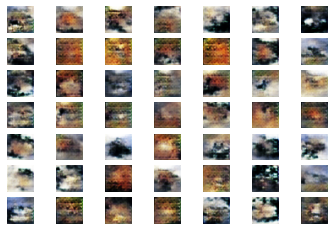

Epoch: 13, Batches/Epoch: 101/195
Accuracy on real data: [0.43220382928848267, 0.7578125]
Accuracy on fake data: [0.6604210138320923, 0.68359375]


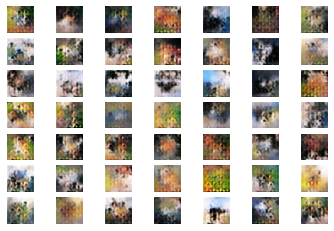

Epoch: 14, Batches/Epoch: 1/195
Accuracy on real data: [0.3305760324001312, 0.8203125]
Accuracy on fake data: [0.6061267256736755, 0.703125]


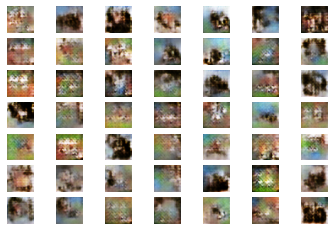

Epoch: 14, Batches/Epoch: 101/195
Accuracy on real data: [0.4686105251312256, 0.73828125]
Accuracy on fake data: [0.42767220735549927, 0.85546875]


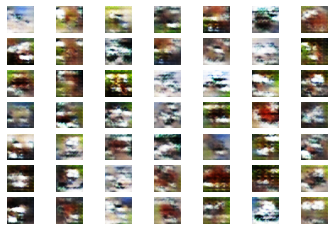

Epoch: 15, Batches/Epoch: 1/195
Accuracy on real data: [0.47049152851104736, 0.7109375]
Accuracy on fake data: [0.37870535254478455, 0.9375]


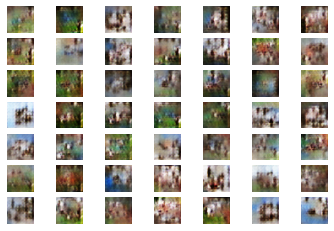

Epoch: 15, Batches/Epoch: 101/195
Accuracy on real data: [0.5878878831863403, 0.6171875]
Accuracy on fake data: [0.5110124349594116, 0.796875]


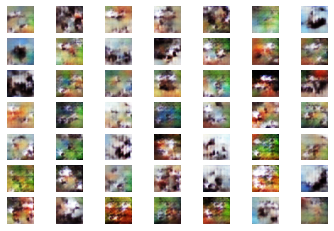

Epoch: 16, Batches/Epoch: 1/195
Accuracy on real data: [0.42029592394828796, 0.7734375]
Accuracy on fake data: [0.38769447803497314, 0.8984375]


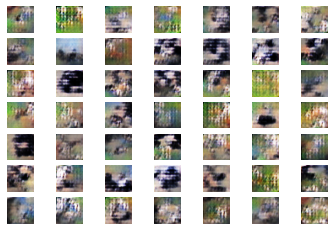

Epoch: 16, Batches/Epoch: 101/195
Accuracy on real data: [0.5164062976837158, 0.671875]
Accuracy on fake data: [0.5333136916160583, 0.78515625]


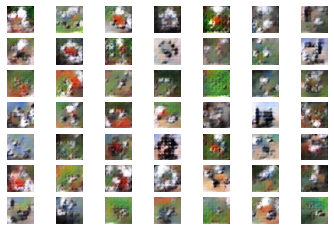

Epoch: 17, Batches/Epoch: 1/195
Accuracy on real data: [0.45796918869018555, 0.7265625]
Accuracy on fake data: [0.2985718846321106, 0.984375]


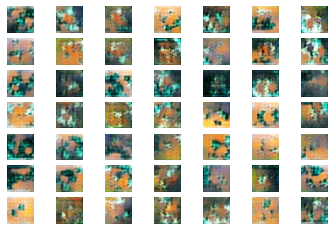

Epoch: 17, Batches/Epoch: 101/195
Accuracy on real data: [0.4023626148700714, 0.79296875]
Accuracy on fake data: [0.6251149773597717, 0.703125]


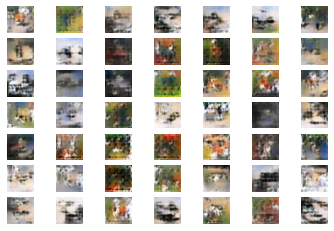

Epoch: 18, Batches/Epoch: 1/195
Accuracy on real data: [0.4530402719974518, 0.71875]
Accuracy on fake data: [0.5058187246322632, 0.85546875]


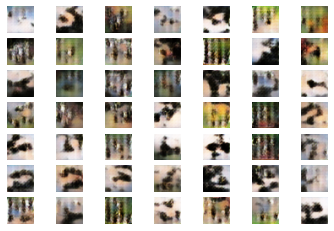

Epoch: 18, Batches/Epoch: 101/195
Accuracy on real data: [0.5609213709831238, 0.6484375]
Accuracy on fake data: [0.42747801542282104, 0.89453125]


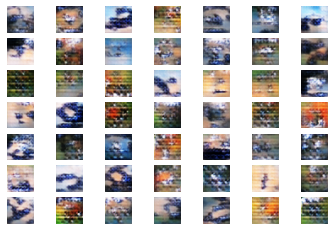

Epoch: 19, Batches/Epoch: 1/195
Accuracy on real data: [0.37648725509643555, 0.85546875]
Accuracy on fake data: [0.6893559098243713, 0.62109375]


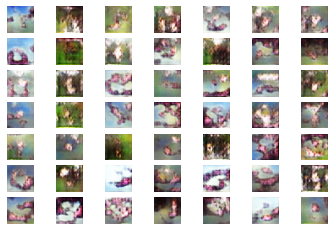

Epoch: 19, Batches/Epoch: 101/195
Accuracy on real data: [0.7193820476531982, 0.5078125]
Accuracy on fake data: [0.4619694650173187, 0.890625]


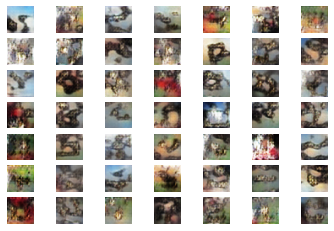

Epoch: 20, Batches/Epoch: 1/195
Accuracy on real data: [0.5762145519256592, 0.5703125]
Accuracy on fake data: [0.5514404773712158, 0.78515625]


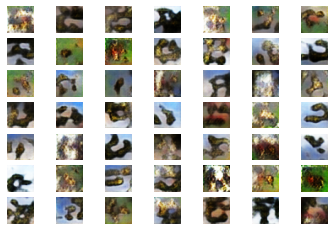

Epoch: 20, Batches/Epoch: 101/195
Accuracy on real data: [0.5429554581642151, 0.6875]
Accuracy on fake data: [0.468628466129303, 0.8671875]


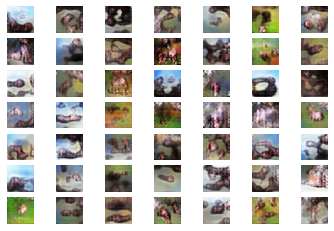

Epoch: 21, Batches/Epoch: 1/195
Accuracy on real data: [0.4516581892967224, 0.7421875]
Accuracy on fake data: [0.617435872554779, 0.734375]


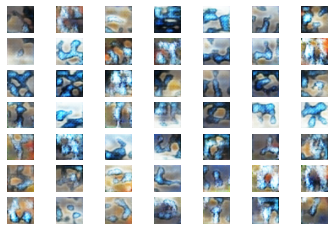

Epoch: 21, Batches/Epoch: 101/195
Accuracy on real data: [0.6234264969825745, 0.54296875]
Accuracy on fake data: [0.5378087759017944, 0.82421875]


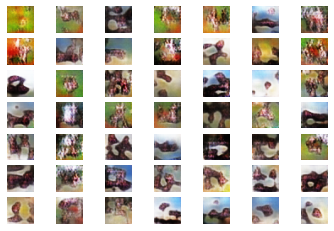

Epoch: 22, Batches/Epoch: 1/195
Accuracy on real data: [0.7805134057998657, 0.38671875]
Accuracy on fake data: [0.4978596568107605, 0.85546875]


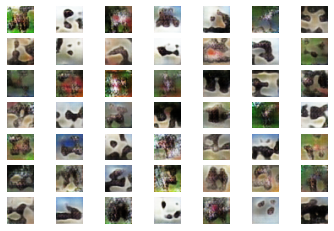

Epoch: 22, Batches/Epoch: 101/195
Accuracy on real data: [0.623498797416687, 0.55859375]
Accuracy on fake data: [0.5339021682739258, 0.796875]


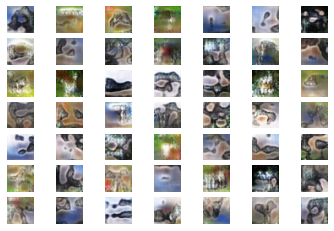

Epoch: 23, Batches/Epoch: 1/195
Accuracy on real data: [0.518423318862915, 0.66015625]
Accuracy on fake data: [0.5136834979057312, 0.8671875]


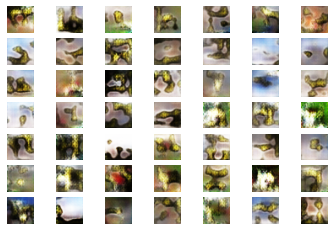

Epoch: 23, Batches/Epoch: 101/195
Accuracy on real data: [0.6778264045715332, 0.53515625]
Accuracy on fake data: [0.610958456993103, 0.703125]


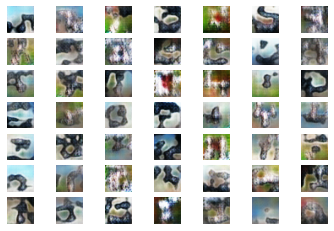

Epoch: 24, Batches/Epoch: 1/195
Accuracy on real data: [0.5117745995521545, 0.70703125]
Accuracy on fake data: [0.6842785477638245, 0.59375]


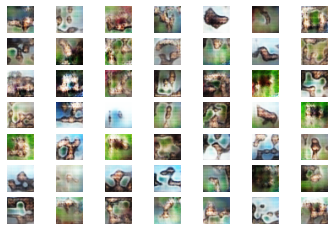

Epoch: 24, Batches/Epoch: 101/195
Accuracy on real data: [0.6341261863708496, 0.546875]
Accuracy on fake data: [0.5535837411880493, 0.796875]


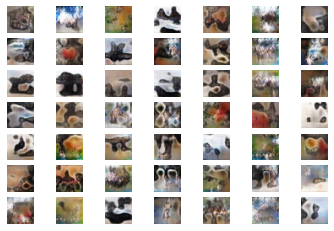

Epoch: 25, Batches/Epoch: 1/195
Accuracy on real data: [0.18545952439308167, 0.96484375]
Accuracy on fake data: [1.080594539642334, 0.34765625]


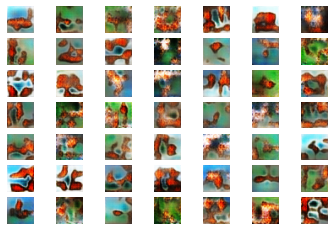

Epoch: 25, Batches/Epoch: 101/195
Accuracy on real data: [0.5130147337913513, 0.65625]
Accuracy on fake data: [0.596911609172821, 0.75]


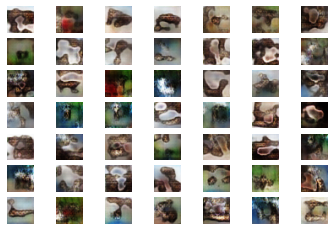

Epoch: 26, Batches/Epoch: 1/195
Accuracy on real data: [0.5120351314544678, 0.66015625]
Accuracy on fake data: [0.5786886215209961, 0.78125]


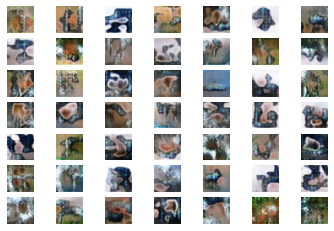

Epoch: 26, Batches/Epoch: 101/195
Accuracy on real data: [0.5459924936294556, 0.6328125]
Accuracy on fake data: [0.7471536993980408, 0.65234375]


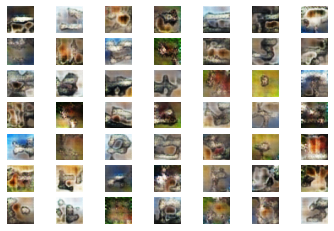

Epoch: 27, Batches/Epoch: 1/195
Accuracy on real data: [0.6145315766334534, 0.50390625]
Accuracy on fake data: [0.5424208045005798, 0.8203125]


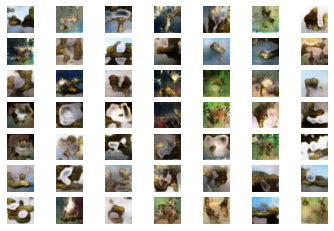

Epoch: 27, Batches/Epoch: 101/195
Accuracy on real data: [0.7284722924232483, 0.46875]
Accuracy on fake data: [0.3375329375267029, 0.94921875]


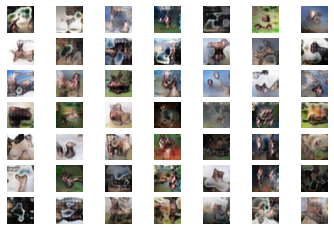

Epoch: 28, Batches/Epoch: 1/195
Accuracy on real data: [0.6979116201400757, 0.4609375]
Accuracy on fake data: [0.45171481370925903, 0.90234375]


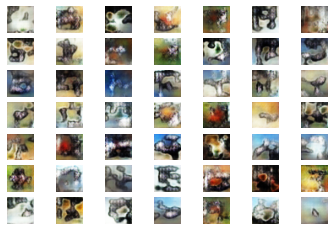

Epoch: 28, Batches/Epoch: 101/195
Accuracy on real data: [0.4031614065170288, 0.796875]
Accuracy on fake data: [0.8028780221939087, 0.484375]


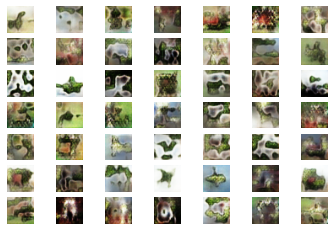

Epoch: 29, Batches/Epoch: 1/195
Accuracy on real data: [0.6739639639854431, 0.51171875]
Accuracy on fake data: [0.45527806878089905, 0.890625]


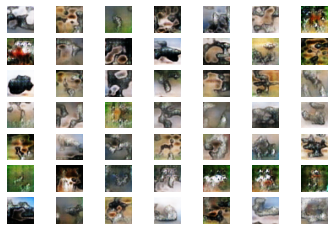

Epoch: 29, Batches/Epoch: 101/195
Accuracy on real data: [0.3797672390937805, 0.79296875]
Accuracy on fake data: [1.0454320907592773, 0.41796875]


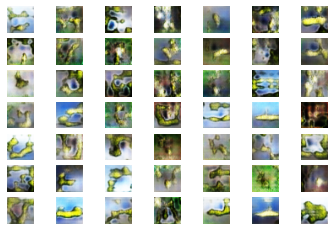

Epoch: 30, Batches/Epoch: 1/195
Accuracy on real data: [0.663795530796051, 0.515625]
Accuracy on fake data: [0.6216831207275391, 0.6875]


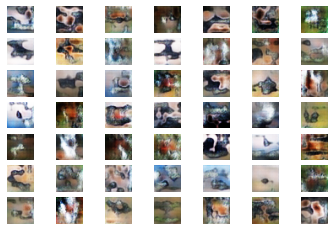

Epoch: 30, Batches/Epoch: 101/195
Accuracy on real data: [0.5589928030967712, 0.625]
Accuracy on fake data: [0.6163249611854553, 0.72265625]


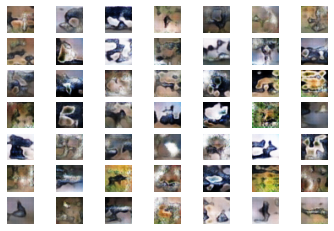

Epoch: 31, Batches/Epoch: 1/195
Accuracy on real data: [0.4857434332370758, 0.72265625]
Accuracy on fake data: [0.5569448471069336, 0.7890625]


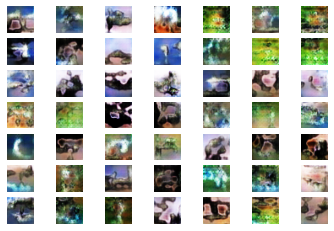

Epoch: 31, Batches/Epoch: 101/195
Accuracy on real data: [0.5527884364128113, 0.61328125]
Accuracy on fake data: [0.49514949321746826, 0.8359375]


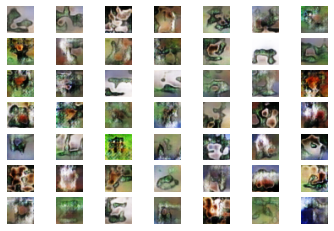

Epoch: 32, Batches/Epoch: 1/195
Accuracy on real data: [0.5820008516311646, 0.59375]
Accuracy on fake data: [0.4929848313331604, 0.8671875]


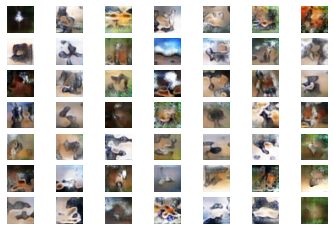

Epoch: 32, Batches/Epoch: 101/195
Accuracy on real data: [0.5632593631744385, 0.6328125]
Accuracy on fake data: [0.5577963590621948, 0.81640625]


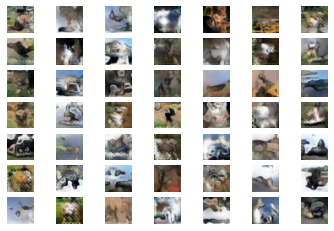

Epoch: 33, Batches/Epoch: 1/195
Accuracy on real data: [0.678053617477417, 0.50390625]
Accuracy on fake data: [0.5183660387992859, 0.87109375]


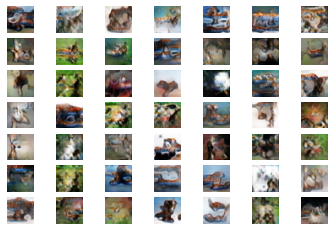

Epoch: 33, Batches/Epoch: 101/195
Accuracy on real data: [0.7351909279823303, 0.4375]
Accuracy on fake data: [0.3885425925254822, 0.94140625]


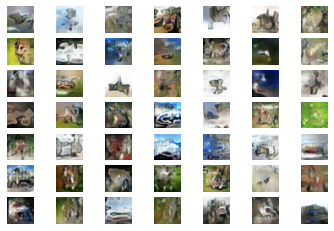

Epoch: 34, Batches/Epoch: 1/195
Accuracy on real data: [0.608627200126648, 0.5703125]
Accuracy on fake data: [0.449675977230072, 0.8984375]


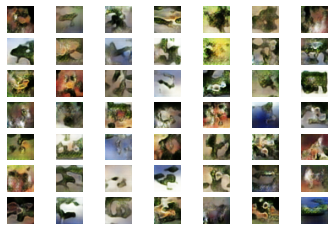

Epoch: 34, Batches/Epoch: 101/195
Accuracy on real data: [0.5496709942817688, 0.66796875]
Accuracy on fake data: [0.5664440989494324, 0.7890625]


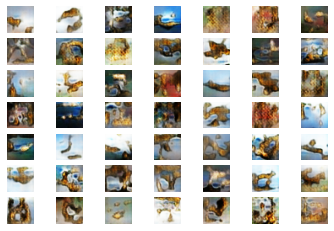

Epoch: 35, Batches/Epoch: 1/195
Accuracy on real data: [0.7125062942504883, 0.47265625]
Accuracy on fake data: [0.5037503838539124, 0.8515625]


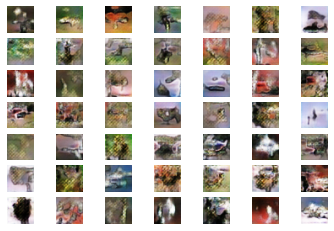

Epoch: 35, Batches/Epoch: 101/195
Accuracy on real data: [0.6557179093360901, 0.5390625]
Accuracy on fake data: [0.46680787205696106, 0.87890625]


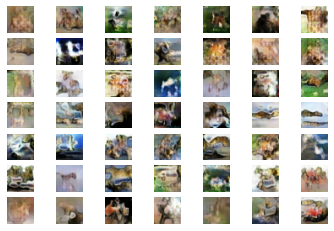

Epoch: 36, Batches/Epoch: 1/195
Accuracy on real data: [0.5221778154373169, 0.6640625]
Accuracy on fake data: [0.5936539173126221, 0.78125]


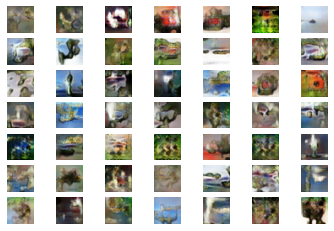

Epoch: 36, Batches/Epoch: 101/195
Accuracy on real data: [0.738044023513794, 0.4296875]
Accuracy on fake data: [0.4634430706501007, 0.9296875]


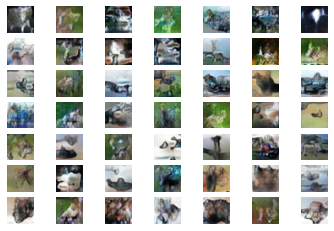

Epoch: 37, Batches/Epoch: 1/195
Accuracy on real data: [0.7768632769584656, 0.40234375]
Accuracy on fake data: [0.4798688590526581, 0.87890625]


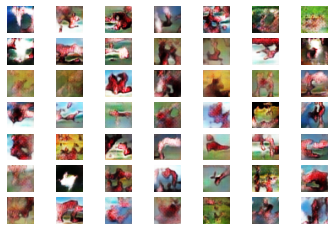

Epoch: 37, Batches/Epoch: 101/195
Accuracy on real data: [0.5624110102653503, 0.5859375]
Accuracy on fake data: [0.5684708952903748, 0.796875]


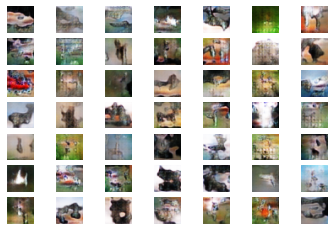

Epoch: 38, Batches/Epoch: 1/195
Accuracy on real data: [0.6325350999832153, 0.57421875]
Accuracy on fake data: [0.5854709148406982, 0.765625]


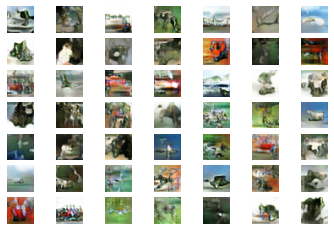

Epoch: 38, Batches/Epoch: 101/195
Accuracy on real data: [0.4658021330833435, 0.7265625]
Accuracy on fake data: [0.8257927298545837, 0.48828125]


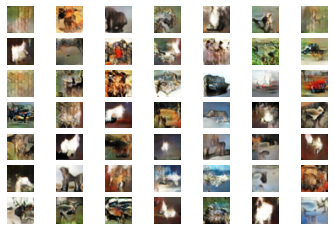

Epoch: 39, Batches/Epoch: 1/195
Accuracy on real data: [0.5106760263442993, 0.68359375]
Accuracy on fake data: [0.7299164533615112, 0.6953125]


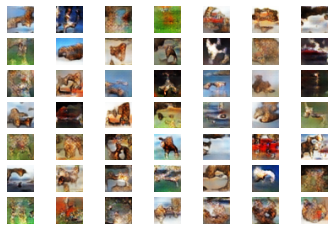

Epoch: 39, Batches/Epoch: 101/195
Accuracy on real data: [0.5568875074386597, 0.671875]
Accuracy on fake data: [0.6423143148422241, 0.7109375]


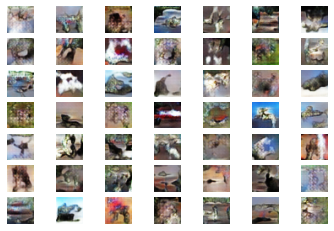

Epoch: 40, Batches/Epoch: 1/195
Accuracy on real data: [0.5439157485961914, 0.64453125]
Accuracy on fake data: [0.5926883816719055, 0.75]


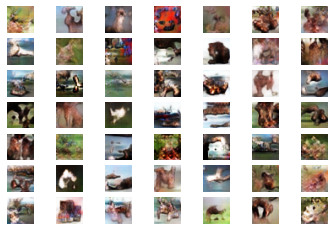

Epoch: 40, Batches/Epoch: 101/195
Accuracy on real data: [0.5300056338310242, 0.6875]
Accuracy on fake data: [0.6642005443572998, 0.60546875]


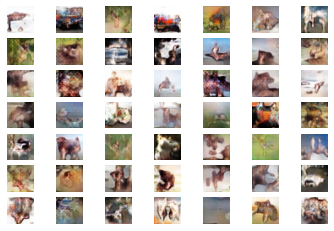

Epoch: 41, Batches/Epoch: 1/195
Accuracy on real data: [0.6155937910079956, 0.58984375]
Accuracy on fake data: [0.5759207010269165, 0.76171875]


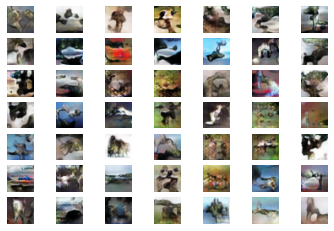

Epoch: 41, Batches/Epoch: 101/195
Accuracy on real data: [0.5329113602638245, 0.640625]
Accuracy on fake data: [0.6762398481369019, 0.65625]


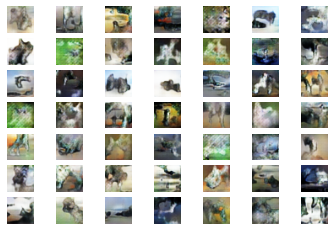

Epoch: 42, Batches/Epoch: 1/195
Accuracy on real data: [0.5278390049934387, 0.63671875]
Accuracy on fake data: [0.6849706768989563, 0.69921875]


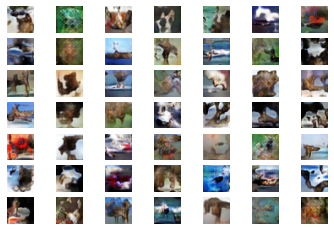

Epoch: 42, Batches/Epoch: 101/195
Accuracy on real data: [0.6096962690353394, 0.5859375]
Accuracy on fake data: [0.48837384581565857, 0.84765625]


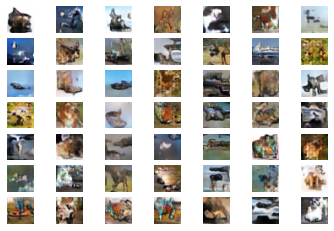

Epoch: 43, Batches/Epoch: 1/195
Accuracy on real data: [0.5706437826156616, 0.59765625]
Accuracy on fake data: [0.5578171014785767, 0.81640625]


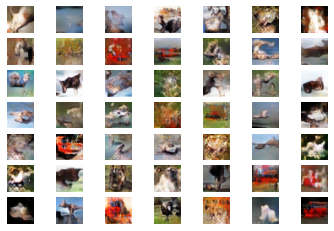

Epoch: 43, Batches/Epoch: 101/195
Accuracy on real data: [0.5815484523773193, 0.59765625]
Accuracy on fake data: [0.5464584231376648, 0.796875]


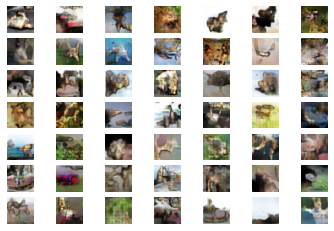

Epoch: 44, Batches/Epoch: 1/195
Accuracy on real data: [0.5616068840026855, 0.61328125]
Accuracy on fake data: [0.6008709669113159, 0.7265625]


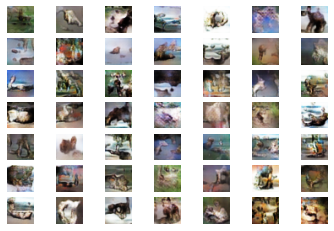

Epoch: 44, Batches/Epoch: 101/195
Accuracy on real data: [0.5971915125846863, 0.5625]
Accuracy on fake data: [0.4496164917945862, 0.90234375]


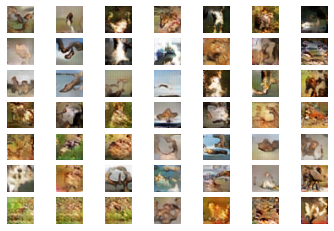

Epoch: 45, Batches/Epoch: 1/195
Accuracy on real data: [0.5980005860328674, 0.609375]
Accuracy on fake data: [0.5195984840393066, 0.81640625]


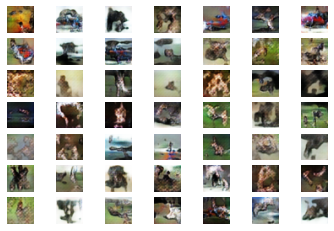

Epoch: 45, Batches/Epoch: 101/195
Accuracy on real data: [0.5779518485069275, 0.58984375]
Accuracy on fake data: [0.5986728072166443, 0.7265625]


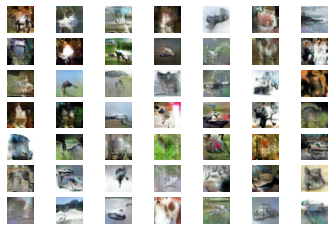

Epoch: 46, Batches/Epoch: 1/195
Accuracy on real data: [0.5573320984840393, 0.6015625]
Accuracy on fake data: [0.6233870387077332, 0.73046875]


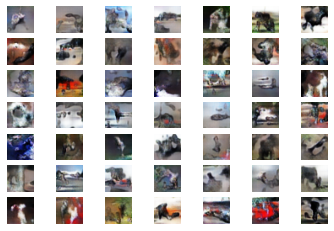

Epoch: 46, Batches/Epoch: 101/195
Accuracy on real data: [0.542037308216095, 0.6875]
Accuracy on fake data: [0.6169741153717041, 0.71484375]


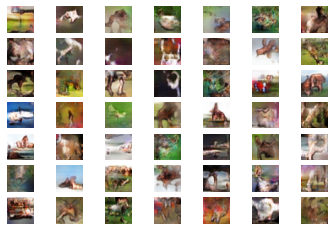

Epoch: 47, Batches/Epoch: 1/195
Accuracy on real data: [0.5914531946182251, 0.61328125]
Accuracy on fake data: [0.6825875639915466, 0.6484375]


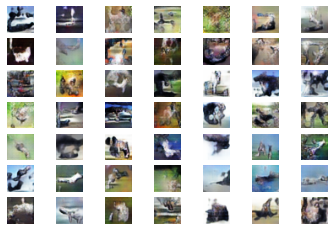

Epoch: 47, Batches/Epoch: 101/195
Accuracy on real data: [0.5491928458213806, 0.66015625]
Accuracy on fake data: [0.5787076354026794, 0.76953125]


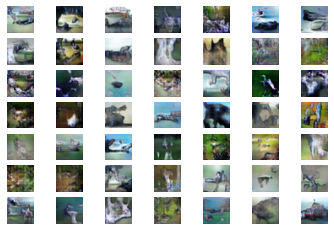

Epoch: 48, Batches/Epoch: 1/195
Accuracy on real data: [0.5099807381629944, 0.69921875]
Accuracy on fake data: [0.6006556153297424, 0.765625]


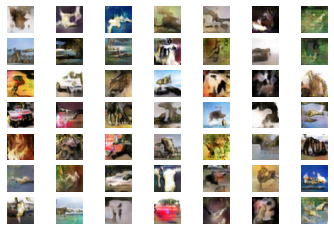

Epoch: 48, Batches/Epoch: 101/195
Accuracy on real data: [0.5480732917785645, 0.67578125]
Accuracy on fake data: [0.5694157481193542, 0.79296875]


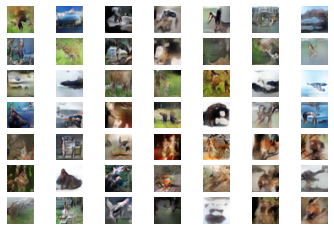

Epoch: 49, Batches/Epoch: 1/195
Accuracy on real data: [0.5865845084190369, 0.5859375]
Accuracy on fake data: [0.5625449419021606, 0.80078125]


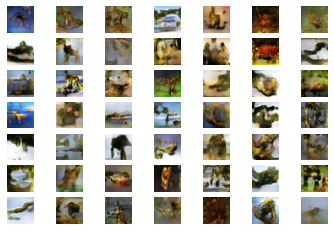

Epoch: 49, Batches/Epoch: 101/195
Accuracy on real data: [0.6013703346252441, 0.58984375]
Accuracy on fake data: [0.5887084603309631, 0.74609375]


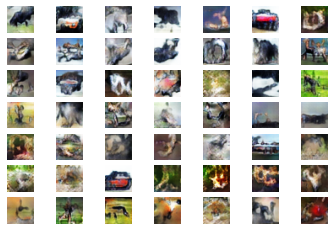

Epoch: 50, Batches/Epoch: 1/195
Accuracy on real data: [0.5356602668762207, 0.65234375]
Accuracy on fake data: [0.5424734354019165, 0.8203125]


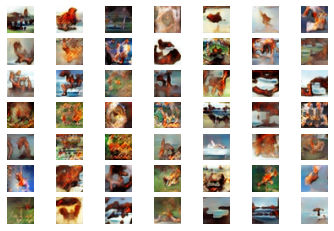

Epoch: 50, Batches/Epoch: 101/195
Accuracy on real data: [0.6489236950874329, 0.50390625]
Accuracy on fake data: [0.5289782285690308, 0.8515625]


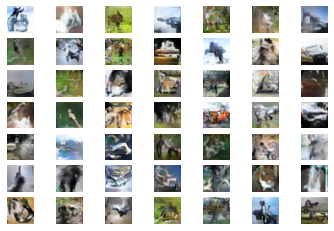

KeyboardInterrupt: 

In [17]:
# size of the latent space
latent_dim = 100
g_model = define_generator(latent_dim= latent_dim) 
d_model = define_discriminator()
gan_model = define_GAN(d_model= d_model,
                       g_model= g_model)
train_GAN(gan_model= gan_model, 
          g_model= g_model,
          d_model= d_model,
          dataset_len= load_data().shape[0],
          latent_dim= latent_dim)

In [26]:
# PREDICTION ON RESULTING MODEL 1

# Load pretrained model 
model = keras.models.load_model('./model_e_46.h5', compile= False)

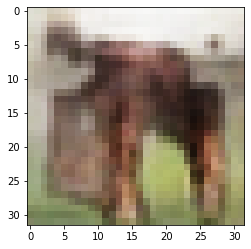

In [23]:
# Plot pre trained model prediction
vec = np.array([[np.cos(_) for _ in range(100)]])
X = ( model.predict(vec) + 1 ) / 2.0
plt.imshow(X[0])
plt.show()

In [24]:
# Define plotting for 49 image sample
def plotModel(model, n_samples=49):
    plt.figure(figsize=(18,9))
    for i in range(n_samples):
        ran = np.random.randn(n_samples, 100)
        sqrt = int(np.sqrt(n_samples))
        plt.subplot(sqrt, sqrt, i+1)
        X = model.predict(ran)
        X = (X + 1) / 2.0
        plt.imshow(X[0])
        plt.axis('off')
    plt.show()

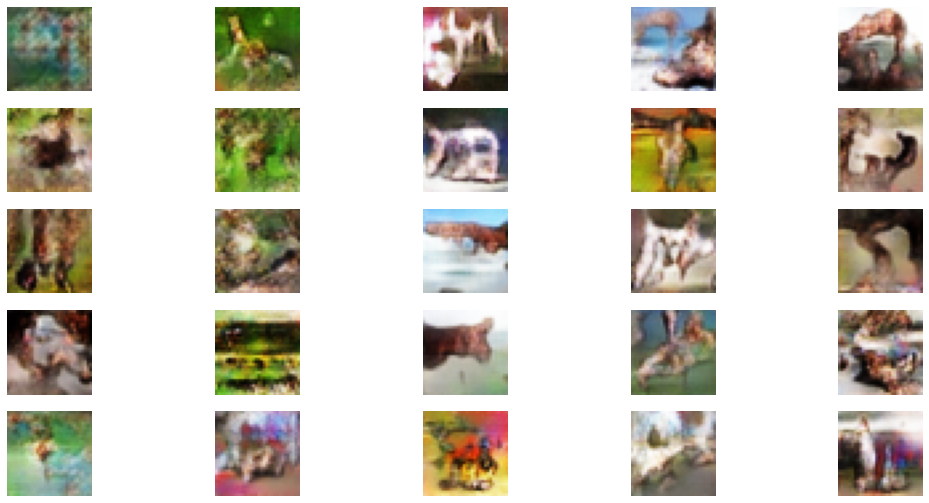

In [25]:
plotModel(model, n_samples= 25)